In [1]:
!pip install numpy

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [2]:
!pip install torch

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [3]:
!pip install matplotlib

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [4]:
!pip install torchvision

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [5]:
!pip install h5py

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [6]:
!pip install pandas

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [7]:
!pip install pyyaml

You should consider upgrading via the '/home/defect/.pyenv/versions/3.8.11/bin/python3.8 -m pip install --upgrade pip' command.


In [1]:
###################################################################################################
#
# Copyright (C) 2023 Maxim Integrated Products, Inc. All Rights Reserved.
#
# Maxim Integrated Products, Inc. Default Copyright Notice:
# https://www.maximintegrated.com/en/aboutus/legal/copyrights.html
#
###################################################################################################

import os
import sys

import numpy as np
import torch

import matplotlib.patches as patches
import matplotlib.pyplot as plt

#from distiller import apputils, model_summaries

sys.path.append(os.path.join(os.getcwd(), '..'))
sys.path.append(os.path.join(os.getcwd(), '../models/'))

from collections import OrderedDict

import ai8x
from datasets import almond

from utils import object_detection_utils as obj_det_utils
from utils import parse_obj_detection_yaml
import parse_qat_yaml
import torch.nn.functional as F
ai85net_tinierssd_almond = __import__("ai85net-tinierssd-almond")
from PIL import Image
from torchvision import transforms

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

#data_path = '../data'
# data_path = '../../../utility'
data_path = '/home/Documents/ECE189/ai8x-training/data'
class Args:
    def __init__(self, act_mode_8bit):
        self.act_mode_8bit = act_mode_8bit
        self.truncate_testset = False

args = Args(act_mode_8bit=False)
Normalize = ai8x.normalize(args=args)
convert_tensor = transforms.ToTensor()
_, test_set = almond.ALMOND_168_224_get_datasets((data_path, args), load_train=False, load_test=True)

IMAGES ARE EXPECTED TO BE 168x224 !
Test dataset length: 3958



In [30]:
num_classes = 2
#checkpoint_path = "../logs/2023.02.07-144918_NewAlmModel_1p_1a_ALM65_30k_blur_bight_gray_randScale1.2-0.8_allback/qat_best.pth.tar"
#checkpoint_path = "../logs/2023.02.07-171001_NewAlmModel_1p_1a_ALM65_30k_blur_bight_gray_randScale1.2-0.8_BG20/qat_best.pth.tar" 
#checkpoint_path = "../logs/2023.02.14-195252_NewAlmModel_2p_2a_ALM65_50k_blur_bight_gray_randScale1.2-0.8_BG20/qat_best.pth.tar"
#checkpoint_path = "../logs/2023.02.15-203556_NewAlmMode_2p_2aFixed_ALM65_50k_blur_bight_gray_randScale1.2-0.8_BG20/qat_best.pth.tar"
#checkpoint_path = "../logs/2023.02.15-172441_NewAlmModel224_168_2p_2aFixed_ALM65_50k_blur_bight_gray_randScale1.2-0.8_BG20/qat_best.pth.tar"
# checkpoint_path = "../logs/2023.05.10-104015/qat_best.pth.tar"     #20000 image with 80 epoch
# checkpoint_path = "../logs/2023.05.10-140119/qat_best.pth.tar"  #with 1/3 of the original data size
# checkpoint_path = "../logs/2023.05.10-155252/qat_best.pth.tar"  #30000 image and 150 epoch
# checkpoint_path = "../logs/2023.05.10-195845/qat_best.pth.tar" #5000 image with 150 epoch
# checkpoint_path = "../logs/2023.05.11-090914/qat_best.pth.tar" #30000 image with  300 epoch
# checkpoint_path = "../logs/2023.05.12-105623/qat_best.pth.tar" #20000 image with  200 epoch
checkpoint_path = "../logs/2023.05.24-172210/qat_best.pth.tar"

qat_policy = '../policies/qat_policy_face.yaml'
qat_policy = parse_qat_yaml.parse(qat_policy)

ai8x.set_device(85, False, False)

model = ai85net_tinierssd_almond.ai85tinierssdalmond(num_classes=num_classes, device=device)

checkpoint = torch.load(checkpoint_path, map_location=device)
state_dict = checkpoint['state_dict']

ai8x.fuse_bn_layers(model)
ai8x.initiate_qat(model, qat_policy)

is_multi_gpu = all([key.startswith('module') for key in state_dict.keys()])

if is_multi_gpu:
    new_state_dict = OrderedDict()
    for key, value in state_dict.items():
        new_key = key.replace('module.', '')
        new_state_dict[new_key] = value

    model.load_state_dict(new_state_dict)

else:
    model.load_state_dict(state_dict)

model = model.to(device)
model.load_state_dict(state_dict)

{'start_epoch': 1, 'weight_bits': 8, 'shift_quantile': 0.995}
Configuring device: MAX78000, simulate=False.


<All keys matched successfully>

In [4]:
obj_detection_params_yaml_file = '../parameters/obj_detection_params_face.yaml'
obj_detection_params = parse_obj_detection_yaml.parse(obj_detection_params_yaml_file)

{'multi_box_loss': {'alpha': 2, 'neg_pos_ratio': 3, 'threshold': 0.5}, 'nms': {'min_score': 0.2, 'max_overlap': 0.3, 'top_k': 20}}


In [31]:
selected_idx = 1000 #np.random.randint(len(test_set)) #139021 139021
model.eval()
boxes = []
img, (boxes, lbls) = test_set[selected_idx]
# imgfile =""
# imgfile ='IMG_20230508_135037.jpg'
# imgfile = '20230509_121042.jpg'
# imgfile = 'IMG_20230509_121530.jpg'
# imgfile = 'IMG_20230511_111050.jpg'
# imgfile = 'IMG_20230511_110920.jpg'
# imgfile = 'IMG_20230511_110949.jpg'
# imgfile = 'IMG_20230511_111016.jpg'
# imgfile = 'IMG_20230511_111033.jpg'
# imgfile = 'IMG_20230511_111050.jpg'
# imgfile = 'Image3.png'
# imgfile = 'Image4.png'
# imgfile = 'Image5.png'
# imgfile = 'Image6.png'
imgfile = 'Image7.png'

#imgfile ='Image_bright.png'
#imgfile ='Image.png'
#imgfile ='Image_brighter.png'
#imgfile ='cam0.jpg'
#imgfile ='color1-2.jpg'
#imgfile ='test1.jpg'
#imgfile ='color1-1.jpg'
if imgfile:
    img = Image.open(imgfile)
    img = img.resize((168, 224))
    img = convert_tensor(img)
    img = Normalize(img)
    img = img.to(device)
else:
    print(type(img))
    img = img.to(device)
print(img.shape)

img_model = img.unsqueeze(0)
print(img_model.shape)

locs, scores = model(img_model)
img_to_plot = ((128*(img.detach().cpu().numpy()+1))).astype(np.uint8)
img_to_plot = img_to_plot.transpose([1,2,0])

predicted_scores = F.softmax(scores, dim=2)
print(predicted_scores)
all_images_boxes, all_images_labels, all_images_scores = \
    model.detect_objects(locs, scores,
                        min_score=0.2,
                        max_overlap=obj_detection_params['nms']['max_overlap'],
                        top_k=obj_detection_params['nms']['top_k'])
print(all_images_boxes,all_images_labels,all_images_scores,boxes)
print(all_images_labels)


torch.Size([3, 224, 168])
torch.Size([1, 3, 224, 168])
tensor([[[0.8800, 0.1200],
         [0.8800, 0.1200],
         [0.8800, 0.1200],
         ...,
         [0.8800, 0.1200],
         [0.8800, 0.1200],
         [0.8800, 0.1200]]], device='cuda:0', grad_fn=<SoftmaxBackward0>)
[tensor([[0.6405, 0.1757, 0.8719, 0.3483],
        [0.1146, 0.4201, 0.3460, 0.6013]], device='cuda:0',
       grad_fn=<CatBackward0>)] [tensor([1, 1], device='cuda:0')] [tensor([0.8800, 0.6993], device='cuda:0', grad_fn=<CatBackward0>)] tensor([[0.3214, 0.4821, 0.5893, 0.6830],
        [0.3988, 0.4688, 0.6548, 0.6607]])
[tensor([1, 1], device='cuda:0')]


<class 'torch.Tensor'>
tensor([[0.3452, 0.7277, 0.6369, 0.9464],
        [0.1012, 0.5491, 0.3631, 0.7455]])
0
1


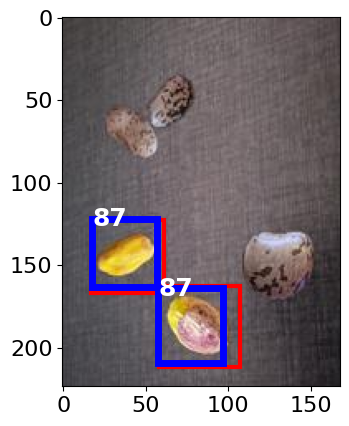

<class 'torch.Tensor'>
tensor([[0.1964, 0.0446, 0.4583, 0.2411]])
0


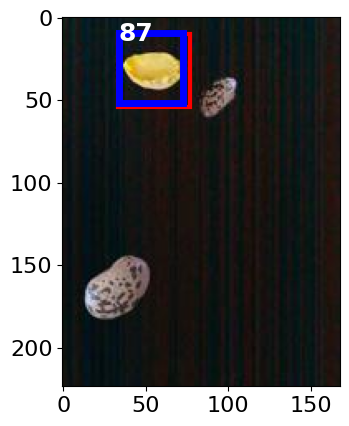

<class 'torch.Tensor'>
tensor([[0.2083, 0.2098, 0.5179, 0.4420],
        [0.1786, 0.3616, 0.4405, 0.5580],
        [0.3571, 0.5580, 0.5952, 0.7366]])
0
1
2


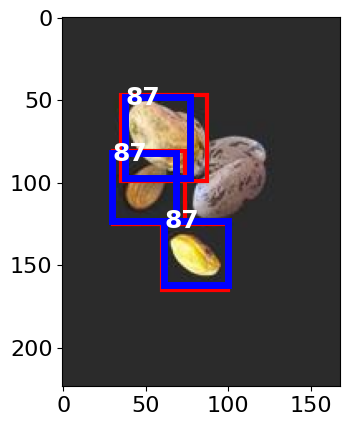

<class 'torch.Tensor'>
tensor([[0.1905, 0.4018, 0.4048, 0.5625],
        [0.2321, 0.5357, 0.4583, 0.7054],
        [0.2679, 0.7277, 0.5060, 0.9062]])
0
1
2


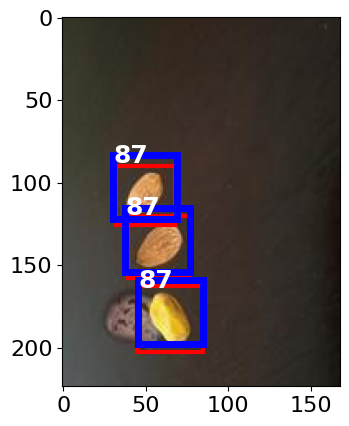

<class 'torch.Tensor'>
tensor([[0.1786, 0.2902, 0.3929, 0.4509],
        [0.5238, 0.4286, 0.7738, 0.6161],
        [0.5000, 0.2321, 0.7976, 0.4554]])
0
1
2


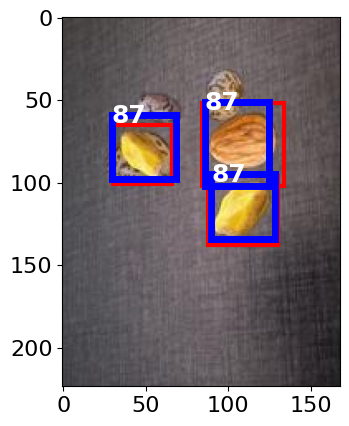

<class 'torch.Tensor'>
tensor([[0.4643, 0.4866, 0.7321, 0.6875],
        [0.0893, 0.6250, 0.3155, 0.7946]])
0
1


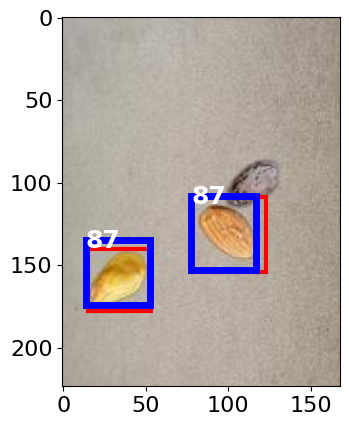

<class 'torch.Tensor'>
tensor([[0.4405, 0.1295, 0.6905, 0.3170],
        [0.5536, 0.4018, 0.8036, 0.5893],
        [0.3929, 0.5045, 0.6726, 0.7143]])
0
1
2


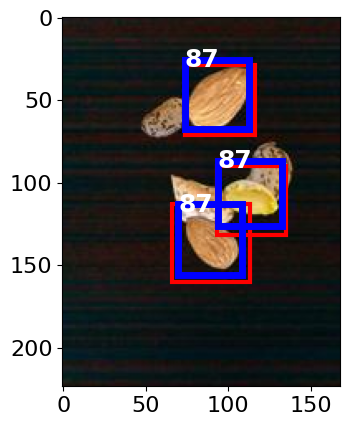

<class 'torch.Tensor'>
tensor([[0.3512, 0.1518, 0.5833, 0.3259],
        [0.3750, 0.7098, 0.6607, 0.9241],
        [0.1190, 0.0848, 0.4286, 0.3170]])
0
1
2


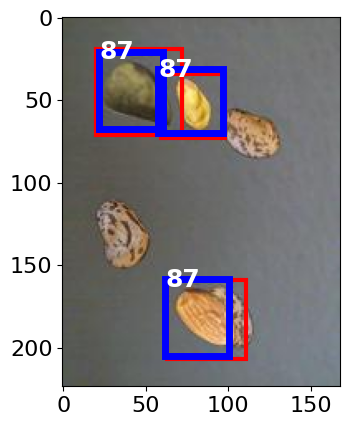

<class 'torch.Tensor'>
tensor([[0.4702, 0.2679, 0.6905, 0.4330]])
0


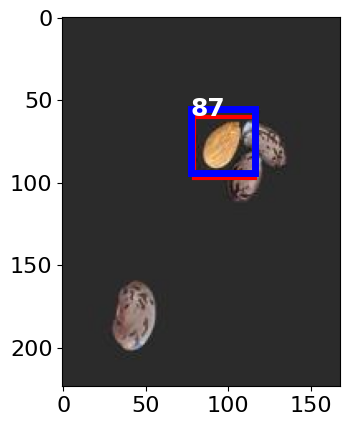

<class 'torch.Tensor'>
tensor([[0.4940, 0.3438, 0.7321, 0.5223],
        [0.6488, 0.0670, 0.8750, 0.2366],
        [0.1369, 0.6562, 0.4464, 0.8884]])
0
1
2


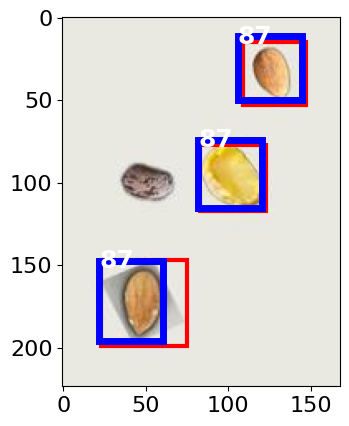

<class 'torch.Tensor'>
tensor([[0.0774, 0.2366, 0.3512, 0.4420]])
0


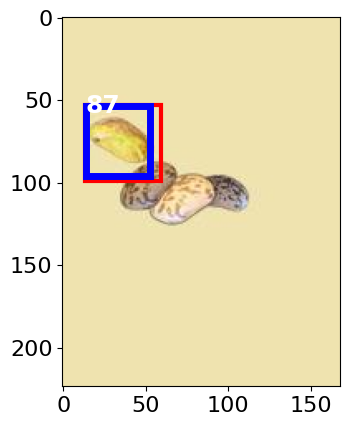

<class 'torch.Tensor'>
tensor([[0.0952, 0.7054, 0.3869, 0.9241],
        [0.3810, 0.5491, 0.6429, 0.7455]])
0
1


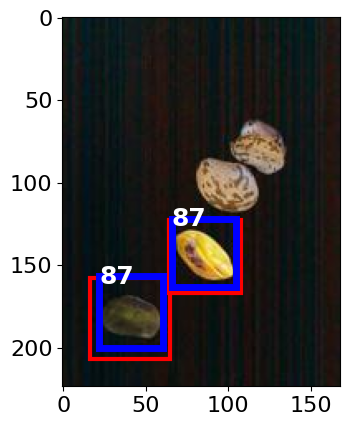

<class 'torch.Tensor'>
tensor([[0.3274, 0.5446, 0.6012, 0.7500],
        [0.4524, 0.5982, 0.6845, 0.7723]])
0
1


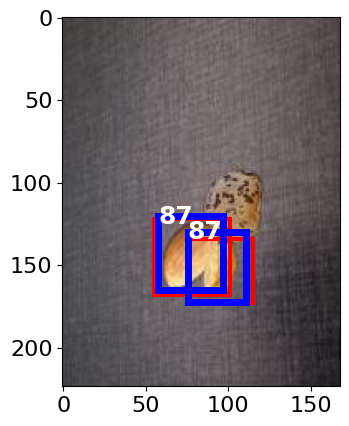

<class 'torch.Tensor'>
tensor([[0.4821, 0.4643, 0.7321, 0.6518]])
0


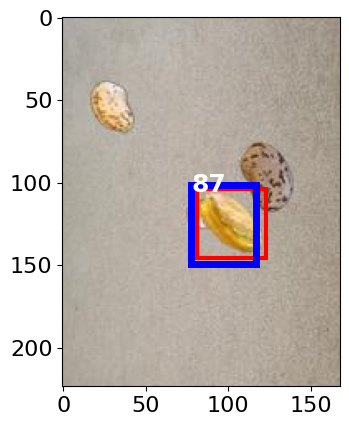

<class 'torch.Tensor'>
tensor([[0.1488, 0.4777, 0.4464, 0.7009]])
0


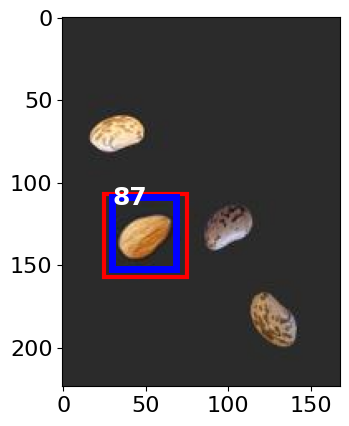

<class 'torch.Tensor'>
tensor([[0.3631, 0.4018, 0.6607, 0.6250],
        [0.0774, 0.5625, 0.2917, 0.7232]])
0
1


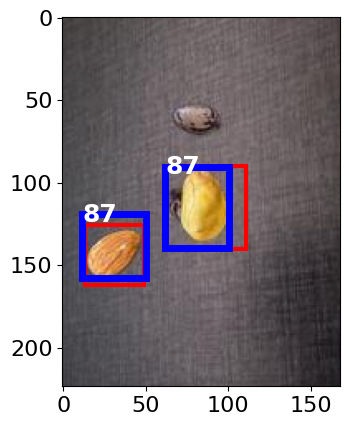

<class 'torch.Tensor'>
tensor([[0.5714, 0.4286, 0.7857, 0.5893],
        [0.1607, 0.2054, 0.4405, 0.4152]])
0
1


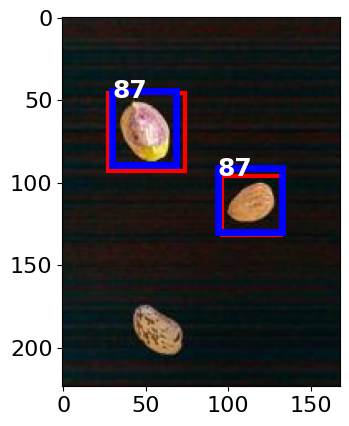

<class 'torch.Tensor'>
tensor([[0.2202, 0.3304, 0.5298, 0.5625],
        [0.5655, 0.4866, 0.8810, 0.7232]])
0
1


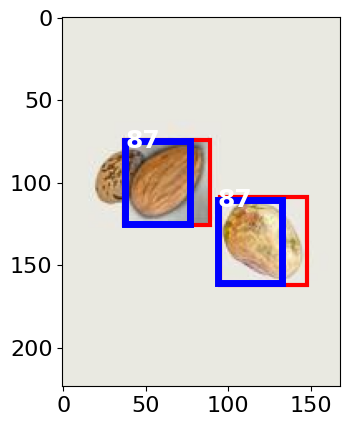

<class 'torch.Tensor'>
tensor([[0.3036, 0.2812, 0.5357, 0.4554]])
0


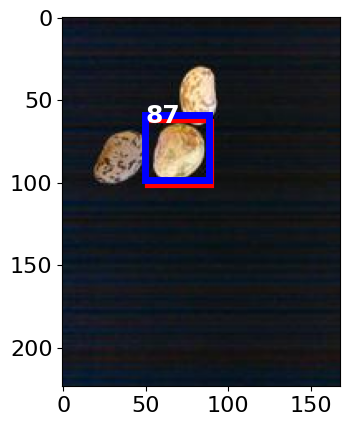

<class 'torch.Tensor'>
tensor([[0.4821, 0.3750, 0.7917, 0.6071],
        [0.6369, 0.6161, 0.9048, 0.8170]])
0
1


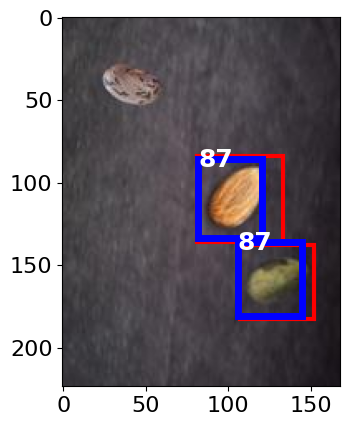

<class 'torch.Tensor'>
tensor([[0.5417, 0.6696, 0.8095, 0.8705]])
0


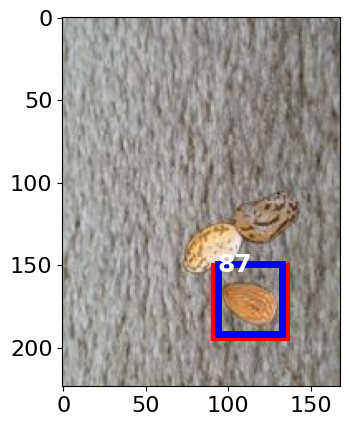

<class 'torch.Tensor'>
tensor([[0.5119, 0.1339, 0.7976, 0.3482],
        [0.0595, 0.6741, 0.3690, 0.9062]])
0
1


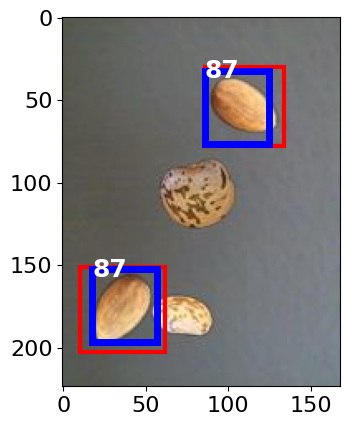

<class 'torch.Tensor'>
tensor([[0.0833, 0.0804, 0.3869, 0.3080]])
0


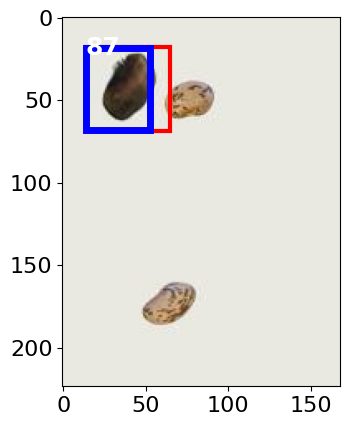

<class 'torch.Tensor'>
tensor([[0.1667, 0.3661, 0.4643, 0.5893]])
0


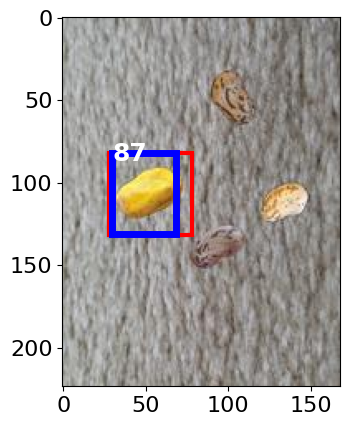

<class 'torch.Tensor'>
tensor([[0.2262, 0.4420, 0.4643, 0.6205],
        [0.1607, 0.3214, 0.3929, 0.4955]])
0
1


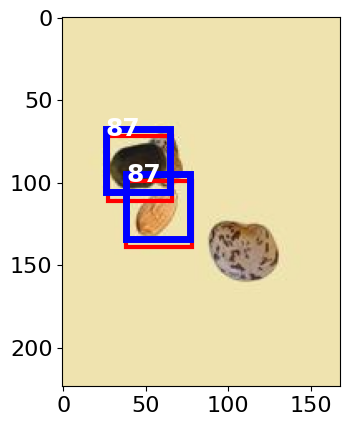

<class 'torch.Tensor'>
tensor([[0.2976, 0.2946, 0.5536, 0.4866],
        [0.6012, 0.3170, 0.8810, 0.5268],
        [0.0595, 0.6250, 0.3095, 0.8125]])
0
1
2


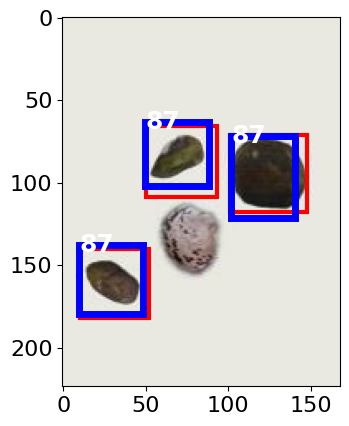

<class 'torch.Tensor'>
tensor([[0.0893, 0.3482, 0.3988, 0.5804],
        [0.1786, 0.3482, 0.4643, 0.5625]])
0
1


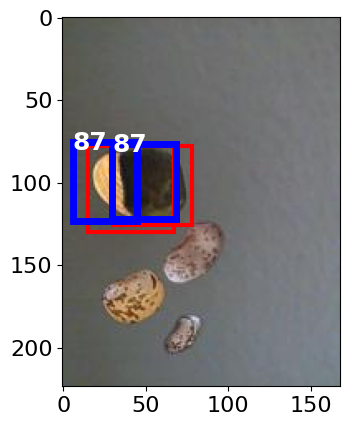

<class 'torch.Tensor'>
tensor([[0.0774, 0.5089, 0.3810, 0.7366],
        [0.0952, 0.5848, 0.3988, 0.8125]])
0
1


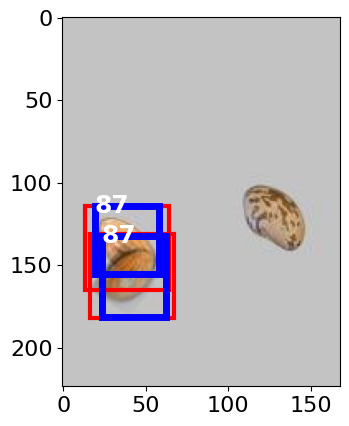

<class 'torch.Tensor'>
tensor([[0.1131, 0.2321, 0.3333, 0.3973],
        [0.0774, 0.0714, 0.3036, 0.2411]])
0
1


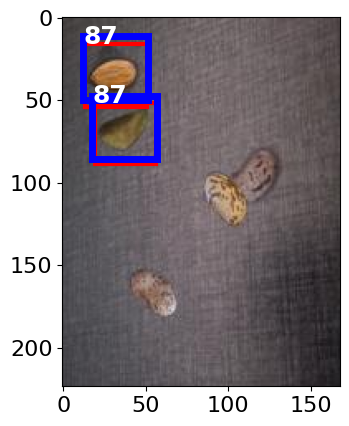

<class 'torch.Tensor'>
tensor([[0.2738, 0.7054, 0.5476, 0.9107],
        [0.3214, 0.5491, 0.5595, 0.7277]])
0
1


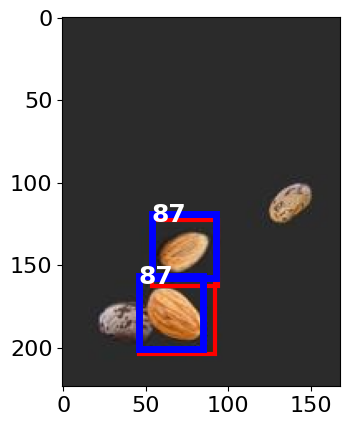

<class 'torch.Tensor'>
tensor([[0.5952, 0.5893, 0.8810, 0.8036],
        [0.5238, 0.4420, 0.8274, 0.6696],
        [0.2381, 0.3571, 0.4940, 0.5491]])
0
1
2


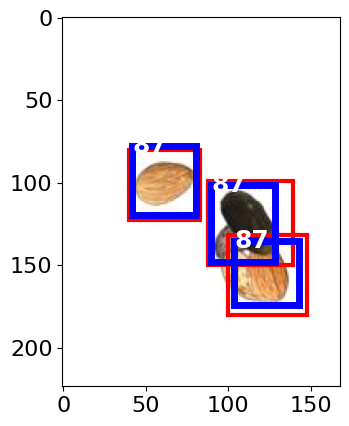

<class 'torch.Tensor'>
tensor([[0.5000, 0.6607, 0.7202, 0.8259],
        [0.5476, 0.3527, 0.7679, 0.5179],
        [0.0595, 0.5134, 0.3631, 0.7411]])
0
1
2


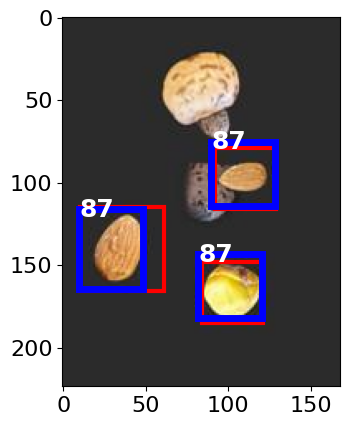

<class 'torch.Tensor'>
tensor([[0.7024, 0.0491, 0.9167, 0.2098]])
0


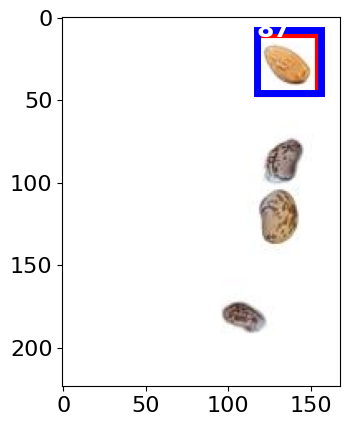

<class 'torch.Tensor'>
tensor([[0.0595, 0.0491, 0.2917, 0.2232],
        [0.1548, 0.5357, 0.4405, 0.7500]])
0
1


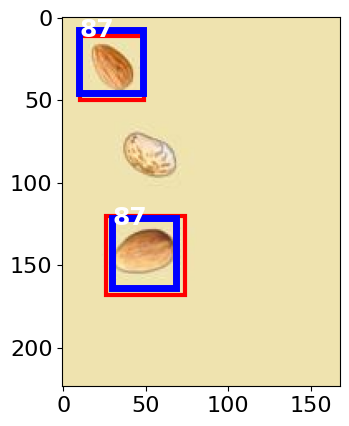

<class 'torch.Tensor'>
tensor([[0.2381, 0.1473, 0.4643, 0.3170],
        [0.4583, 0.3304, 0.7024, 0.5134],
        [0.1488, 0.5982, 0.4226, 0.8036]])
0
1
2


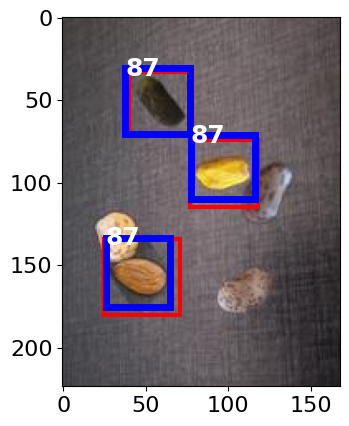

<class 'torch.Tensor'>
tensor([[0.4524, 0.1205, 0.6845, 0.2946],
        [0.5417, 0.4286, 0.7976, 0.6205]])
0
1


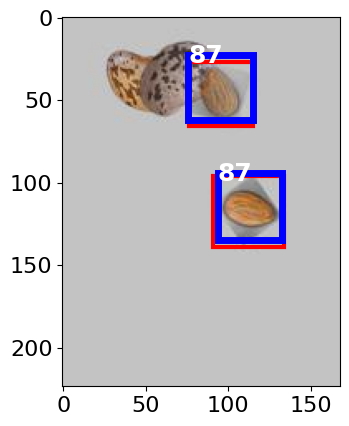

<class 'torch.Tensor'>
tensor([[0.4048, 0.3036, 0.6845, 0.5134],
        [0.5298, 0.1071, 0.7440, 0.2679]])
0
1


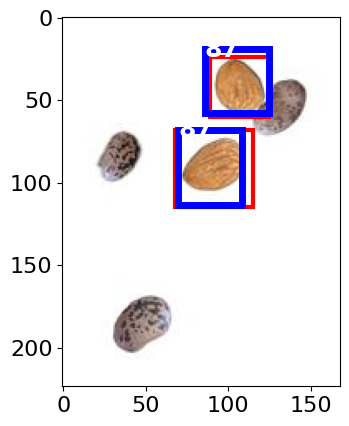

<class 'torch.Tensor'>
tensor([[0.2500, 0.6518, 0.5179, 0.8527],
        [0.1905, 0.5804, 0.4643, 0.7857],
        [0.4048, 0.6786, 0.6488, 0.8616]])
0
1
2


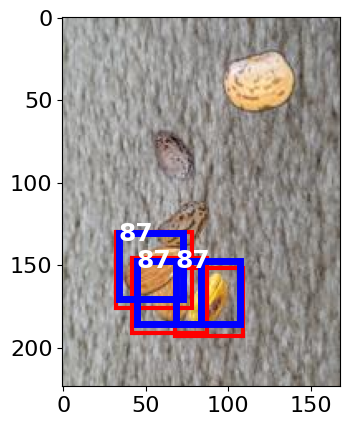

<class 'torch.Tensor'>
tensor([[0.3631, 0.6071, 0.6667, 0.8348]])
0


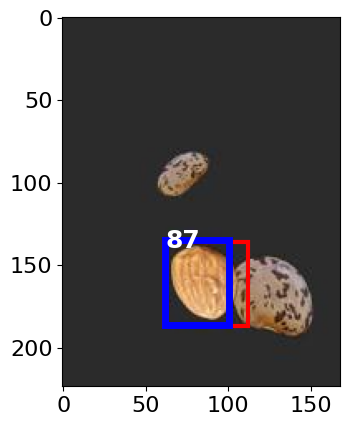

<class 'torch.Tensor'>
tensor([[0.1310, 0.3973, 0.3631, 0.5714],
        [0.1964, 0.6295, 0.5060, 0.8616]])
0
1


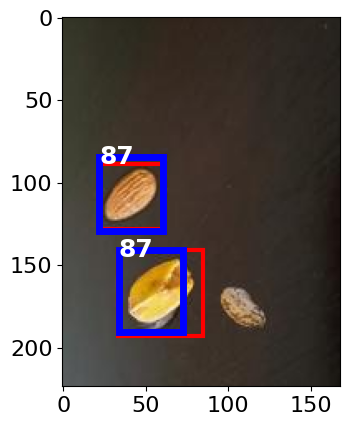

<class 'torch.Tensor'>
tensor([[0.0774, 0.3036, 0.3393, 0.5000],
        [0.3095, 0.1786, 0.6012, 0.3973]])
0
1


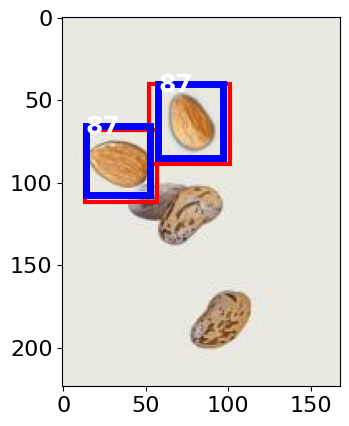

<class 'torch.Tensor'>
tensor([[0.5000, 0.0536, 0.7679, 0.2545]])
0


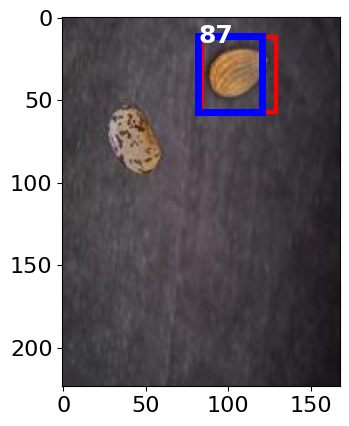

<class 'torch.Tensor'>
tensor([[0.5357, 0.2009, 0.8095, 0.4062],
        [0.4643, 0.4777, 0.7679, 0.7054],
        [0.3810, 0.4598, 0.6488, 0.6607]])
0
1
2


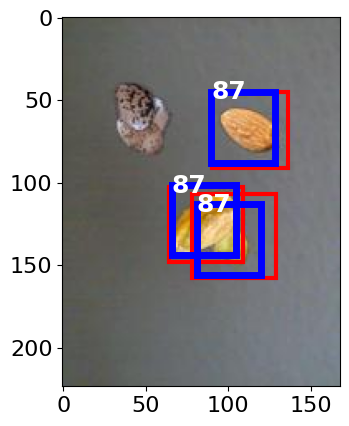

<class 'torch.Tensor'>
tensor([[0.1012, 0.5670, 0.4167, 0.8036]])
0


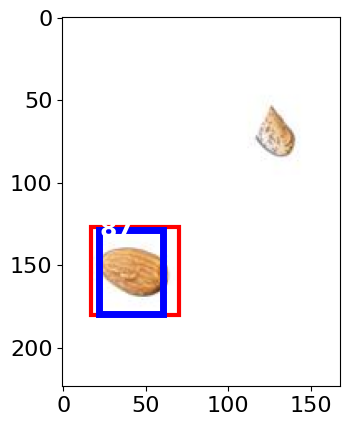

<class 'torch.Tensor'>
tensor([[0.1250, 0.4062, 0.3988, 0.6116]])
0


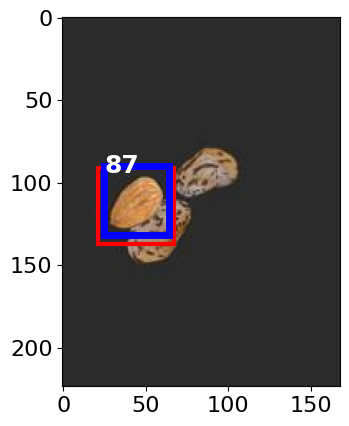

<class 'torch.Tensor'>
tensor([[0.2738, 0.1964, 0.5119, 0.3750],
        [0.5179, 0.5491, 0.8155, 0.7723],
        [0.4286, 0.1562, 0.6905, 0.3527]])
0
1
2


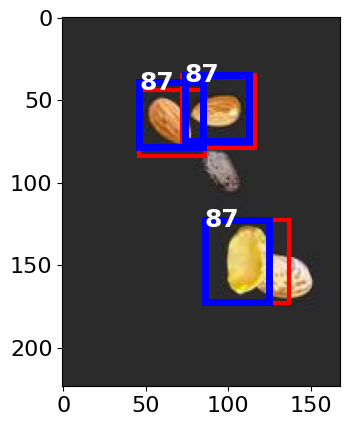

<class 'torch.Tensor'>
tensor([[0.3393, 0.2232, 0.6250, 0.4375]])
0


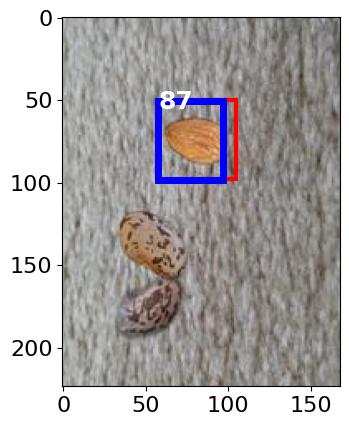

<class 'torch.Tensor'>
tensor([[0.4702, 0.3973, 0.6845, 0.5580],
        [0.0952, 0.5179, 0.3750, 0.7277],
        [0.2857, 0.2188, 0.5595, 0.4241]])
0
1
2


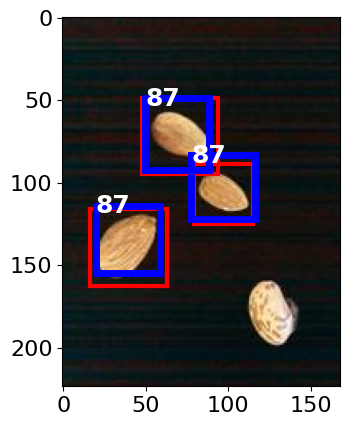

<class 'torch.Tensor'>
tensor([[0.3571, 0.2277, 0.6071, 0.4152],
        [0.2738, 0.1830, 0.5417, 0.3839]])
0
1


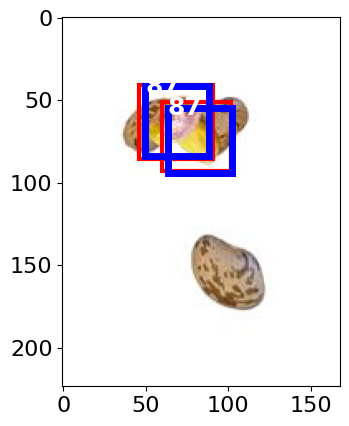

<class 'torch.Tensor'>
tensor([[0.3274, 0.3527, 0.5417, 0.5134],
        [0.3750, 0.7098, 0.6667, 0.9286],
        [0.2917, 0.3036, 0.5833, 0.5223]])
0
1


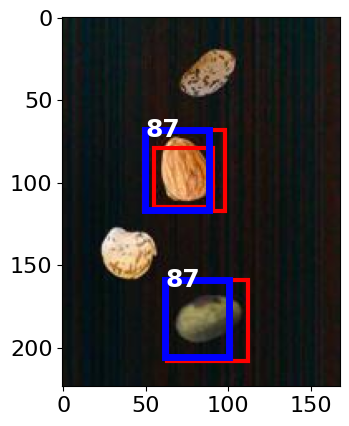

<class 'torch.Tensor'>
tensor([[0.5714, 0.6384, 0.8333, 0.8348],
        [0.0655, 0.3214, 0.2976, 0.4955],
        [0.4583, 0.4598, 0.7738, 0.6964]])
0
1
2


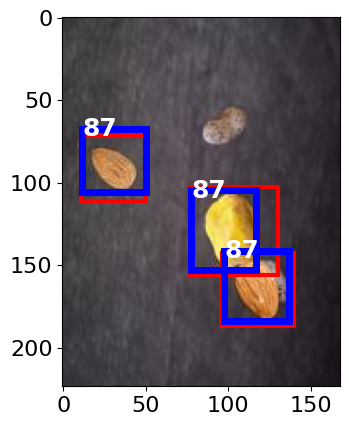

<class 'torch.Tensor'>
tensor([[0.6845, 0.1786, 0.9048, 0.3438]])
0


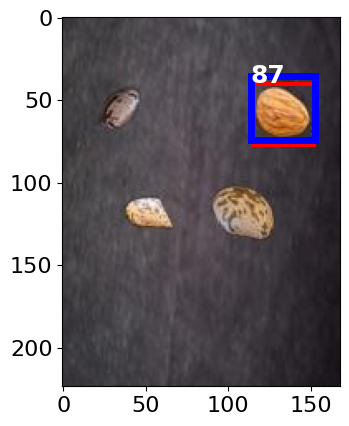

<class 'torch.Tensor'>
tensor([[0.6071, 0.4777, 0.9167, 0.7098],
        [0.5714, 0.3616, 0.8095, 0.5402],
        [0.1131, 0.3438, 0.3631, 0.5312]])
0
1
2


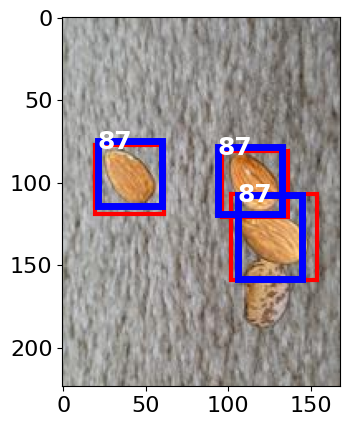

<class 'torch.Tensor'>
tensor([[0.6131, 0.5089, 0.9107, 0.7321]])
0


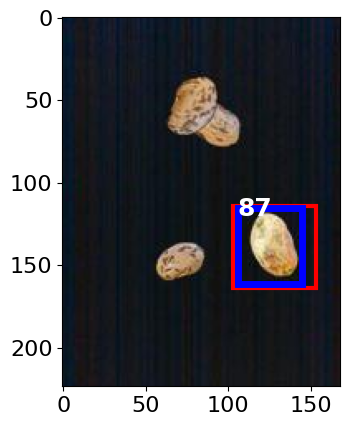

<class 'torch.Tensor'>
tensor([[0.2976, 0.0848, 0.5595, 0.2812]])
0


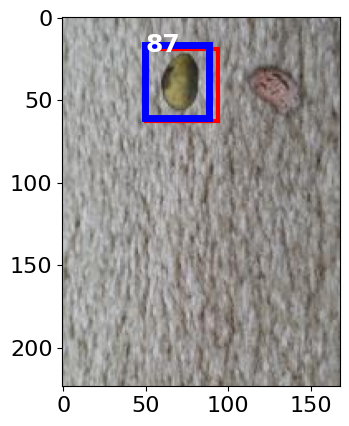

<class 'torch.Tensor'>
tensor([[0.5179, 0.2277, 0.7321, 0.3884],
        [0.1667, 0.3125, 0.4583, 0.5312],
        [0.4762, 0.6027, 0.7143, 0.7812]])
0
1
2


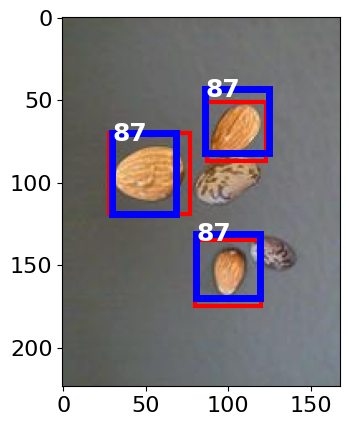

<class 'torch.Tensor'>
tensor([[0.0833, 0.1384, 0.3571, 0.3438]])
0


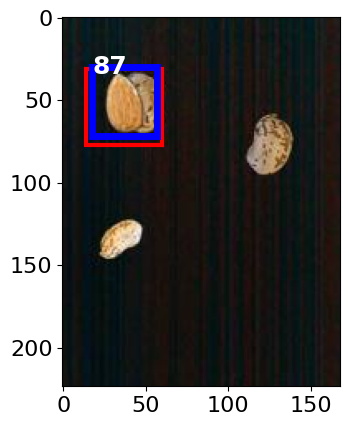

<class 'torch.Tensor'>
tensor([[0.4821, 0.1473, 0.7679, 0.3616]])
0


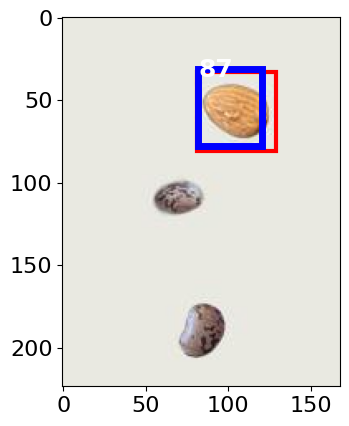

<class 'torch.Tensor'>
tensor([[0.4762, 0.4598, 0.6964, 0.6250],
        [0.4524, 0.0804, 0.7083, 0.2723],
        [0.1964, 0.3616, 0.4286, 0.5357]])
0
1
2


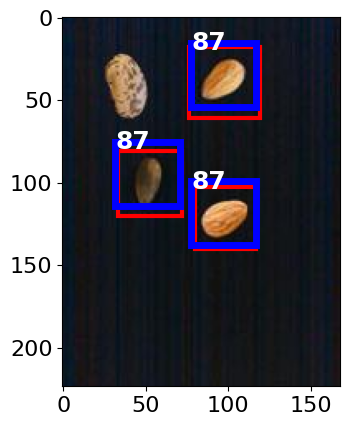

<class 'torch.Tensor'>
tensor([[0.1488, 0.4598, 0.4167, 0.6607]])
0


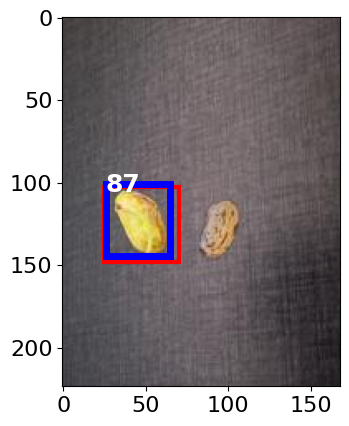

<class 'torch.Tensor'>
tensor([[0.6726, 0.1920, 0.9107, 0.3705],
        [0.2321, 0.1161, 0.5357, 0.3438],
        [0.4405, 0.3750, 0.6607, 0.5402]])
0
1


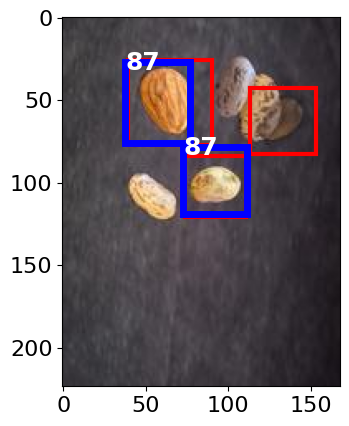

<class 'torch.Tensor'>
tensor([[0.1607, 0.2589, 0.4643, 0.4866],
        [0.2917, 0.6295, 0.5774, 0.8438]])
0
1


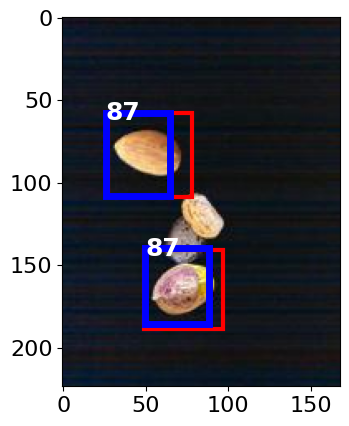

<class 'torch.Tensor'>
tensor([[0.5655, 0.3884, 0.8631, 0.6116],
        [0.1369, 0.4375, 0.4464, 0.6696],
        [0.2679, 0.1920, 0.5357, 0.3929]])
0
1
2


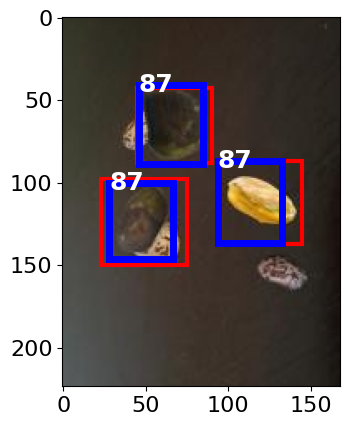

<class 'torch.Tensor'>
tensor([[0.1429, 0.6295, 0.3810, 0.8080],
        [0.4524, 0.4464, 0.7560, 0.6741]])
0
1


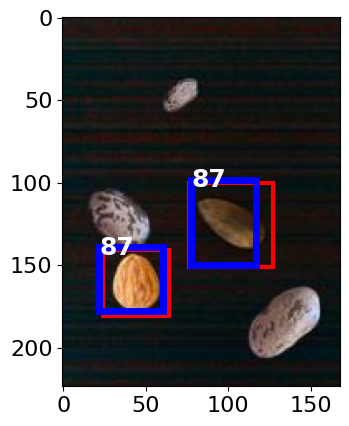

<class 'torch.Tensor'>
tensor([[0.4107, 0.5179, 0.7262, 0.7545],
        [0.2500, 0.2545, 0.5000, 0.4420],
        [0.7202, 0.6027, 0.9345, 0.7634]])
0
1
2


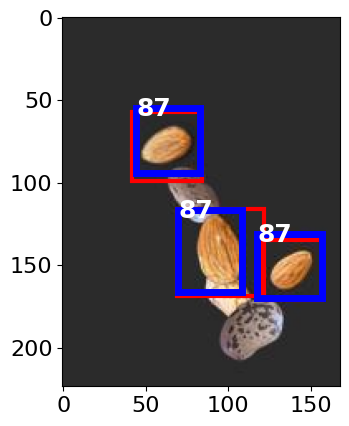

<class 'torch.Tensor'>
tensor([[0.4881, 0.7455, 0.7560, 0.9464],
        [0.3095, 0.4821, 0.6250, 0.7188],
        [0.4464, 0.5134, 0.6607, 0.6741]])
0
1
2


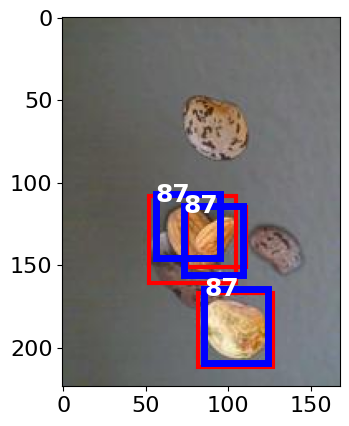

<class 'torch.Tensor'>
tensor([[0.5179, 0.2277, 0.8274, 0.4598],
        [0.1786, 0.5982, 0.4762, 0.8214],
        [0.3631, 0.4018, 0.6429, 0.6116]])
0
1
2


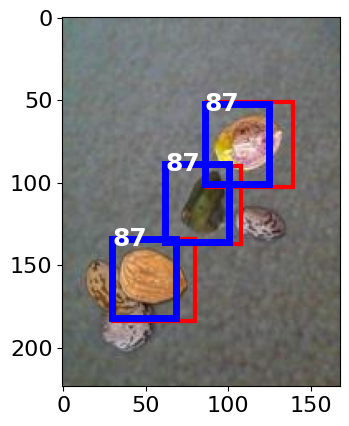

<class 'torch.Tensor'>
tensor([[0.2083, 0.1920, 0.5000, 0.4107]])
0


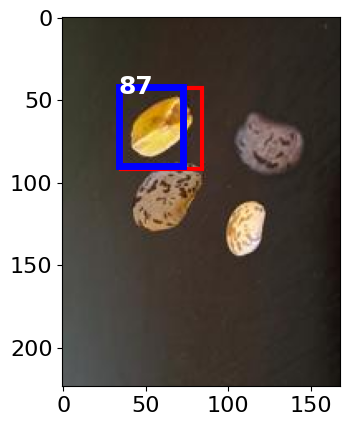

<class 'torch.Tensor'>
tensor([[0.1964, 0.1161, 0.5119, 0.3527],
        [0.3452, 0.1384, 0.6131, 0.3393],
        [0.4286, 0.5580, 0.7321, 0.7857]])
0
1
2


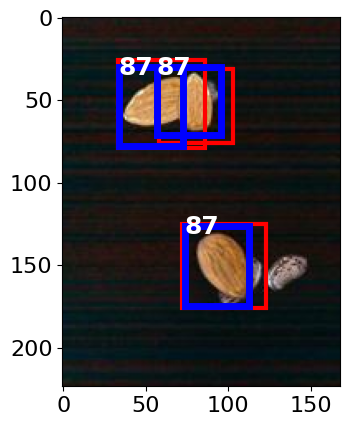

<class 'torch.Tensor'>
tensor([[0.0595, 0.7054, 0.3631, 0.9330]])
0


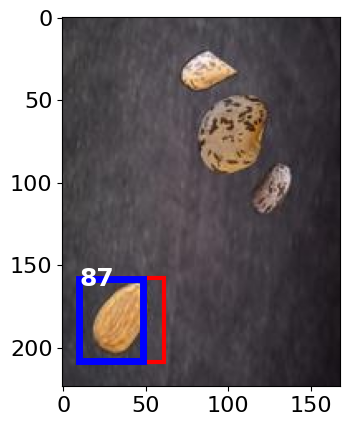

<class 'torch.Tensor'>
tensor([[0.0774, 0.5982, 0.3750, 0.8214]])
0


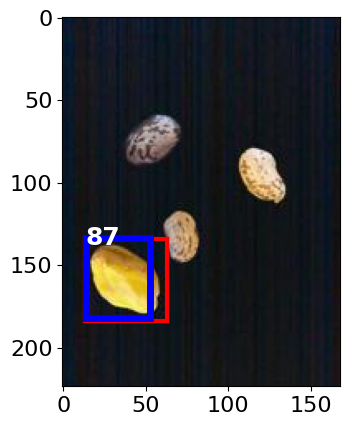

<class 'torch.Tensor'>
tensor([[0.3869, 0.4196, 0.6310, 0.6027]])
0


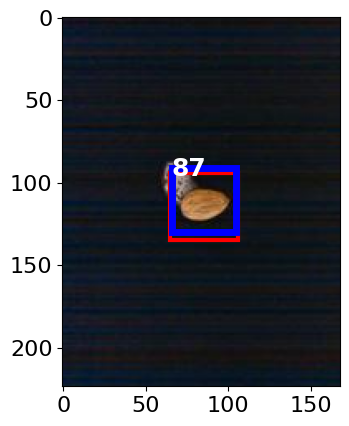

<class 'torch.Tensor'>
tensor([[0.3988, 0.2857, 0.6131, 0.4464]])
0


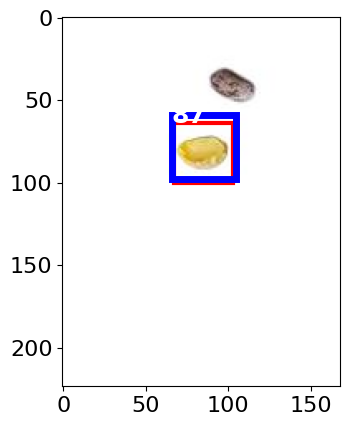

<class 'torch.Tensor'>
tensor([[0.4702, 0.0536, 0.7440, 0.2589]])
0


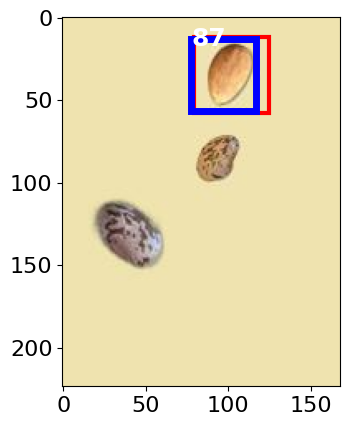

<class 'torch.Tensor'>
tensor([[0.6667, 0.6830, 0.8929, 0.8527]])
0


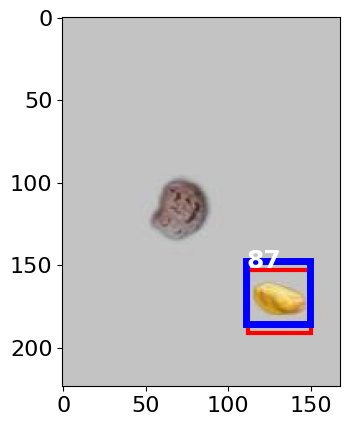

<class 'torch.Tensor'>
tensor([[0.4405, 0.3125, 0.7560, 0.5491]])
0


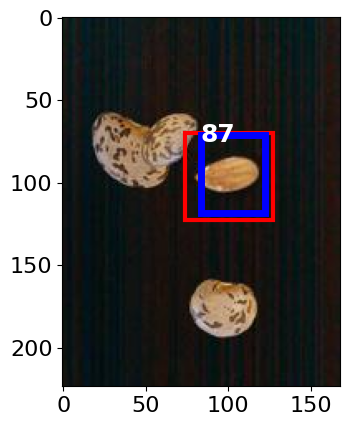

<class 'torch.Tensor'>
tensor([[0.2381, 0.6652, 0.4881, 0.8527],
        [0.3988, 0.0804, 0.6726, 0.2857]])
0
1


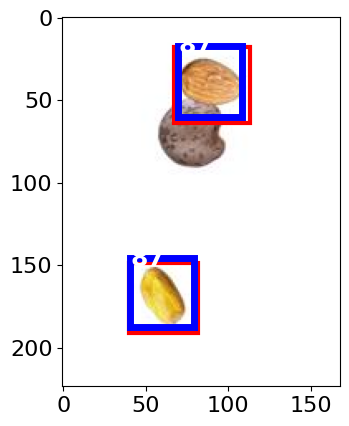

<class 'torch.Tensor'>
tensor([[0.5595, 0.7589, 0.8155, 0.9509],
        [0.2083, 0.1741, 0.4940, 0.3884]])
0
1


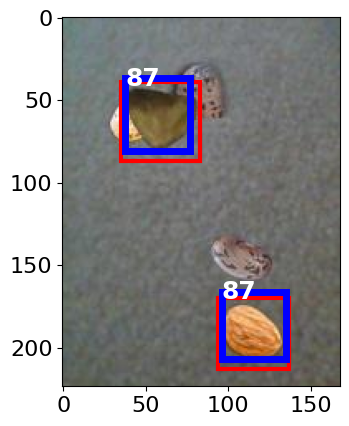

<class 'torch.Tensor'>
tensor([[0.1369, 0.4866, 0.4286, 0.7054],
        [0.3393, 0.6920, 0.5774, 0.8705],
        [0.4643, 0.1429, 0.7083, 0.3259]])
0
1
2


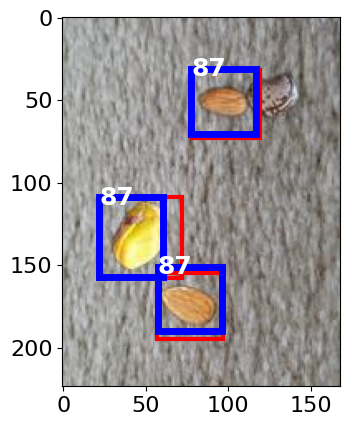

<class 'torch.Tensor'>
tensor([[0.1310, 0.0938, 0.4048, 0.2991],
        [0.3274, 0.6920, 0.6369, 0.9241],
        [0.5893, 0.0804, 0.8214, 0.2545]])
0
1
2


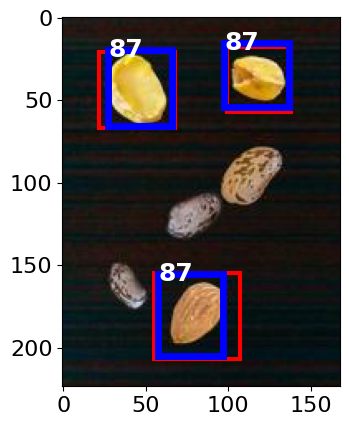

<class 'torch.Tensor'>
tensor([[0.3690, 0.6429, 0.6488, 0.8527],
        [0.1071, 0.3571, 0.4107, 0.5848],
        [0.3214, 0.5179, 0.6310, 0.7500]])
0
1
2


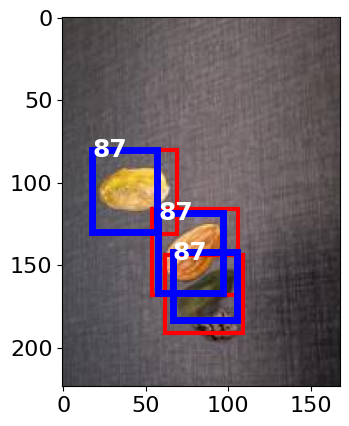

<class 'torch.Tensor'>
tensor([[0.3333, 0.6875, 0.6369, 0.9152],
        [0.3690, 0.0714, 0.6786, 0.3036]])
0
1


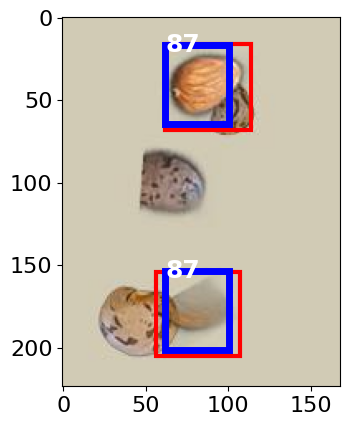

<class 'torch.Tensor'>
tensor([[0.1071, 0.6920, 0.3571, 0.8795],
        [0.4345, 0.6295, 0.6905, 0.8214]])
0
1


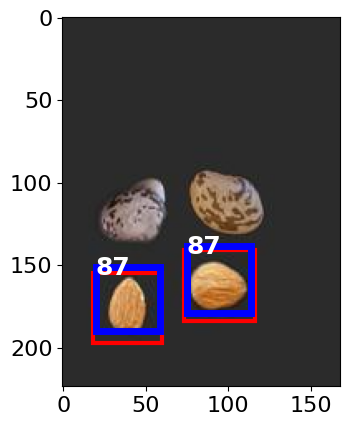

<class 'torch.Tensor'>
tensor([[0.6250, 0.6518, 0.8810, 0.8438]])
0


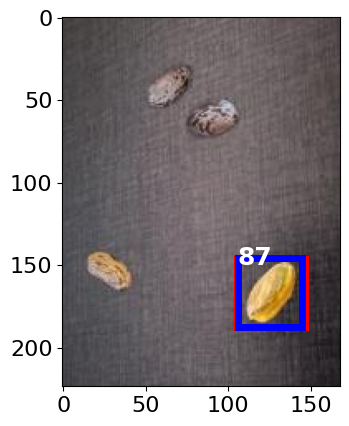

<class 'torch.Tensor'>
tensor([[0.3631, 0.4554, 0.6131, 0.6429],
        [0.5060, 0.5670, 0.8214, 0.8036]])
0
1


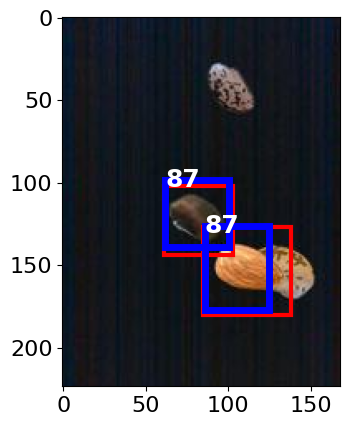

<class 'torch.Tensor'>
tensor([[0.5000, 0.0491, 0.8036, 0.2768],
        [0.5476, 0.1518, 0.8214, 0.3571]])
0
1


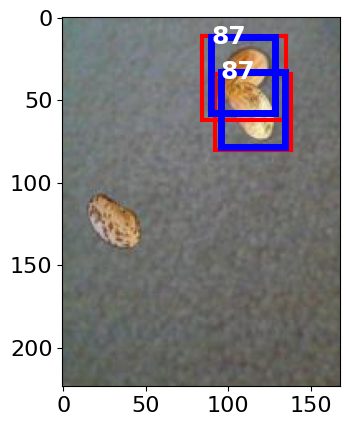

<class 'torch.Tensor'>
tensor([[0.3333, 0.4688, 0.5952, 0.6652]])
0


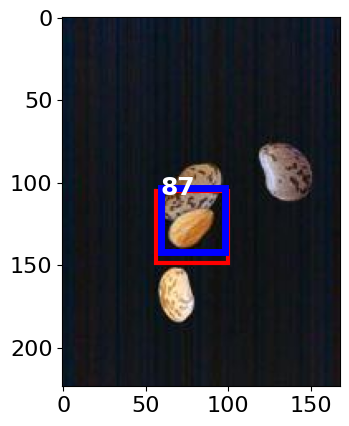

<class 'torch.Tensor'>
tensor([[0.4167, 0.1384, 0.6845, 0.3393],
        [0.2619, 0.3929, 0.5060, 0.5759],
        [0.5774, 0.5134, 0.8452, 0.7143]])
0
1
2


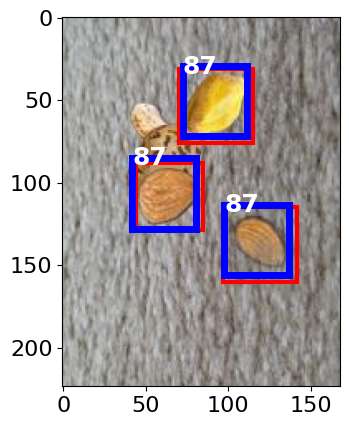

<class 'torch.Tensor'>
tensor([[0.4464, 0.1964, 0.6667, 0.3616]])
0


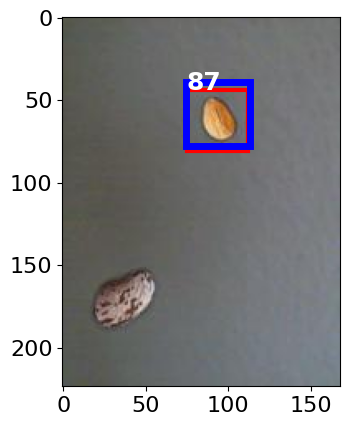

<class 'torch.Tensor'>
tensor([[0.3571, 0.3482, 0.6310, 0.5536],
        [0.2738, 0.1518, 0.5536, 0.3616]])
0
1


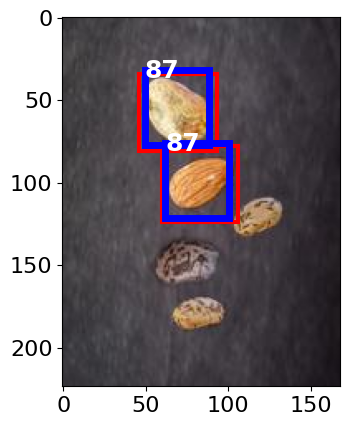

<class 'torch.Tensor'>
tensor([[0.4464, 0.2946, 0.7619, 0.5312],
        [0.1964, 0.7232, 0.4107, 0.8839]])
0
1


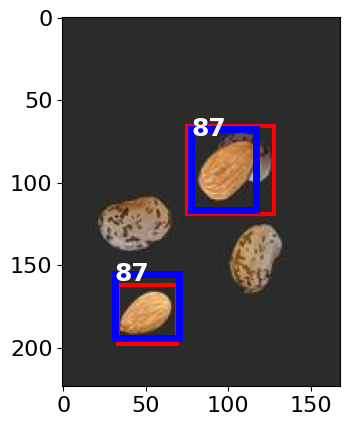

<class 'torch.Tensor'>
tensor([[0.1548, 0.5089, 0.3988, 0.6920],
        [0.1250, 0.0670, 0.3631, 0.2455]])
0
1


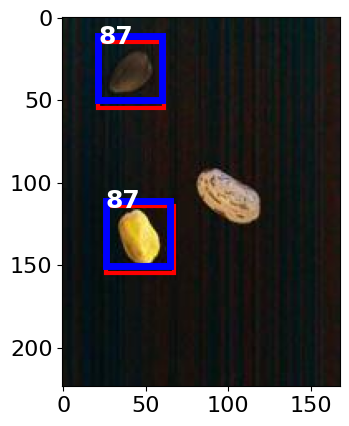

<class 'torch.Tensor'>
tensor([[0.2381, 0.5625, 0.5417, 0.7902],
        [0.1607, 0.6920, 0.4226, 0.8884]])
0
1


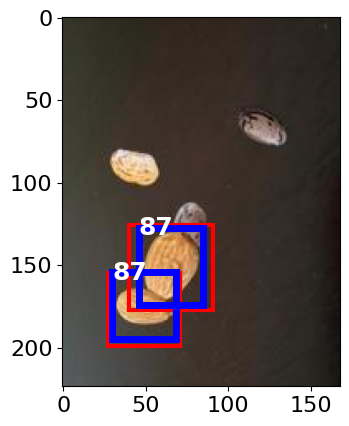

<class 'torch.Tensor'>
tensor([[0.1548, 0.7232, 0.4583, 0.9509]])
0


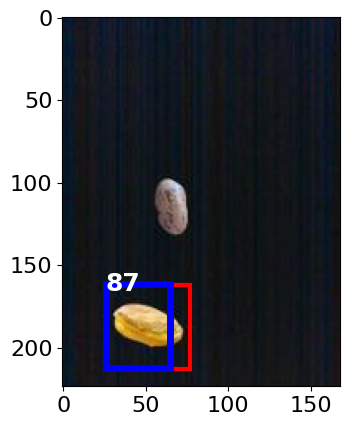

<class 'torch.Tensor'>
tensor([[0.2917, 0.0714, 0.5417, 0.2589],
        [0.4345, 0.4866, 0.7083, 0.6920]])
0
1


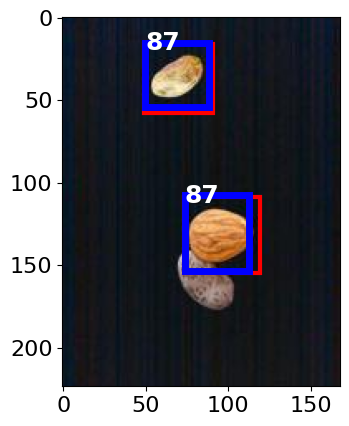

<class 'torch.Tensor'>
tensor([[0.5833, 0.2009, 0.8869, 0.4286]])
0


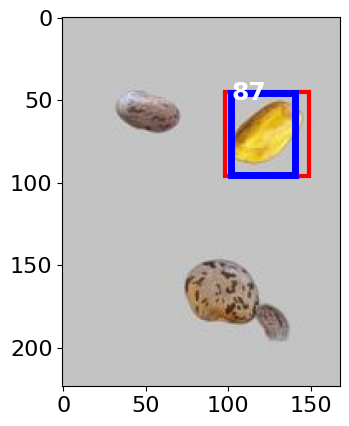

<class 'torch.Tensor'>
tensor([[0.6607, 0.5893, 0.8988, 0.7679],
        [0.4464, 0.1607, 0.7440, 0.3839]])
0
1


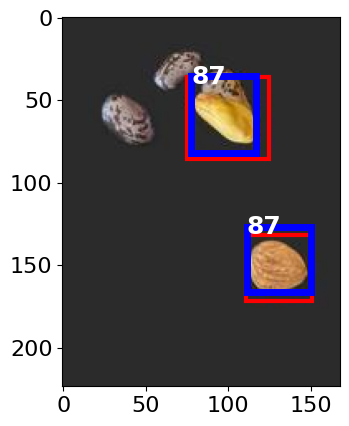

<class 'torch.Tensor'>
tensor([[0.5952, 0.1607, 0.8214, 0.3304],
        [0.1131, 0.5804, 0.3810, 0.7812],
        [0.3690, 0.3482, 0.6429, 0.5536]])
0
1
2


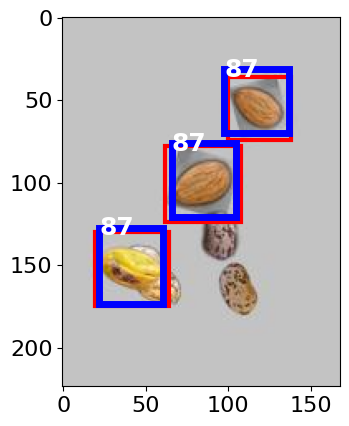

<class 'torch.Tensor'>
tensor([[0.5357, 0.5848, 0.8155, 0.7946],
        [0.7024, 0.5848, 0.9345, 0.7589]])
0
1


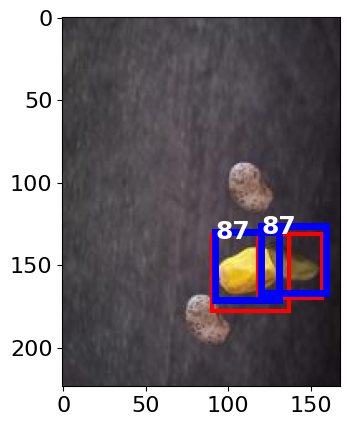

<class 'torch.Tensor'>
tensor([[0.2738, 0.4866, 0.5833, 0.7188],
        [0.5714, 0.6429, 0.8214, 0.8304],
        [0.1190, 0.7902, 0.3333, 0.9509]])
0
1
2


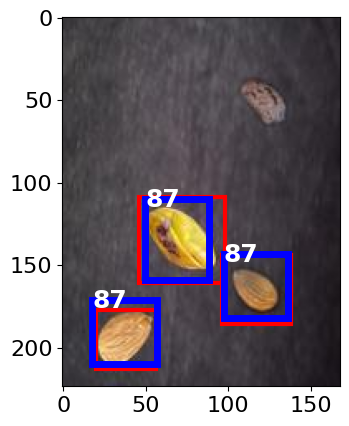

In [15]:
for x in range(100):
    selected_idx = x #np.random.randint(len(test_set)) #139021 139021
    model.eval()
    boxes = []
    img, (boxes, lbls) = test_set[selected_idx]
    imgfile =""
    # imgfile ='IMG_20230508_135037.jpg'
    # imgfile = '20230509_121042.jpg'
    # imgfile = 'IMG_20230509_121530.jpg'

    #imgfile ='Image_bright.png'
    #imgfile ='Image.png'
    #imgfile ='Image_brighter.png'
    #imgfile ='cam0.jpg'
    #imgfile ='color1-2.jpg'
    #imgfile ='test1.jpg'
    #imgfile ='color1-1.jpg'
    if imgfile:
        img = Image.open(imgfile)
        img = img.resize((168, 224))
        img = convert_tensor(img)
        img = Normalize(img)
        img = img.to(device)
    else:
        print(type(img))
        img = img.to(device)
    # print(img.shape)

    img_model = img.unsqueeze(0)
    # print(img_model.shape)

    locs, scores = model(img_model)
    img_to_plot = ((128*(img.detach().cpu().numpy()+1))).astype(np.uint8)
    img_to_plot = img_to_plot.transpose([1,2,0])

    predicted_scores = F.softmax(scores, dim=2)
    # print(predicted_scores)
    all_images_boxes, all_images_labels, all_images_scores = \
        model.detect_objects(locs, scores,
                            min_score=0.2,
                            max_overlap=obj_detection_params['nms']['max_overlap'],
                            top_k=obj_detection_params['nms']['top_k'])
    # print(all_images_boxes,all_images_labels,all_images_scores,boxes)
    # print(all_images_labels)


    %matplotlib inline
    boxes_resized = []
    all_boxes_resized = []
    fig, ax = plt.subplots(1)
    ax.imshow(img_to_plot)

    plt.tick_params(labelsize=16)
            
    #subplot_title=("Test set item: " + str(selected_idx))
    #ax.set_title(subplot_title, fontsize = 20)


    # Truth boxes
    if imgfile == '':
        print(boxes)
        for box in boxes:
            #
            if True:
                box[0] = box[0] * test_set.img_size[0]
                box[2] = box[2] * test_set.img_size[0]
                box[1] = box[1] * test_set.img_size[1]
                box[3] = box[3] * test_set.img_size[1]
            else:
            # if x-y needs to be swapped
                box[0] = box[0] * test_set.img_size[1]
                box[2] = box[2] * test_set.img_size[1]
                box[1] = box[1] * test_set.img_size[0]
                box[3] = box[3] * test_set.img_size[0]
            
        boxes_resized = boxes
        for b in range(len(boxes)):
            bb = boxes_resized[b]
            rect = patches.Rectangle((bb[0], bb[1]), bb[2] - bb[0], bb[3] - bb[1], linewidth=3,
                                    edgecolor='r', facecolor="none")
            ax.add_patch(rect)
            
    # Predicted boxes
    for pbox in all_images_boxes:
        for i in range (pbox.shape[0]):
            #
            if True:
                pbox[i][0] = pbox[i][0] * test_set.img_size[0]
                pbox[i][2] = pbox[i][2] * test_set.img_size[0]
                pbox[i][1] = pbox[i][1] * test_set.img_size[1]
                pbox[i][3] = pbox[i][3] * test_set.img_size[1]
            else:
            # if x-y needs to be swapped
                pbox[i][0] = pbox[i][0] * test_set.img_size[1]
                pbox[i][2] = pbox[i][2] * test_set.img_size[1]
                pbox[i][1] = pbox[i][1] * test_set.img_size[0]
                pbox[i][3] = pbox[i][3] * test_set.img_size[0]
            
    all_boxes_resized = all_images_boxes
    # print(all_boxes_resized)
    detected_labels = [val.item() for val in all_images_labels[0]]
    # print(len(all_boxes_resized[0]))
    # print(detected_labels[0])
    for b in range(len(all_boxes_resized[0])):
        print(b)
        if(detected_labels[b] != 0):
            bb = all_boxes_resized[0][b].detach().cpu().numpy()
            rect = patches.Rectangle((bb[0], bb[1]), bb[2] - bb[0], bb[3] - bb[1], linewidth=5,
                                    edgecolor='b', facecolor="none")
            
            ax.text(bb[0],(bb[1]), int(100*all_images_scores[0][b].item()), verticalalignment='center', color='white', fontsize=18, weight='bold')
            ax.add_patch(rect)    
    plt.show()

[tensor([[107.6097,  39.3538, 146.4821,  78.0170],
        [ 19.2611,  94.0993,  58.1335, 134.6813]], device='cuda:0',
       grad_fn=<CopySlices>)]
2
1
0
1


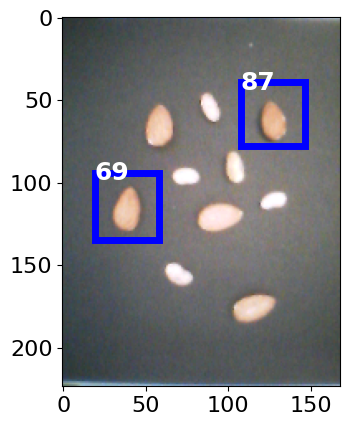

In [32]:
%matplotlib inline
boxes_resized = []
all_boxes_resized = []
fig, ax = plt.subplots(1)
ax.imshow(img_to_plot)

plt.tick_params(labelsize=16)
        
#subplot_title=("Test set item: " + str(selected_idx))
#ax.set_title(subplot_title, fontsize = 20)


# Truth boxes
if imgfile == '':
    print(boxes)
    for box in boxes:
        #
        if True:
            box[0] = box[0] * test_set.img_size[0]
            box[2] = box[2] * test_set.img_size[0]
            box[1] = box[1] * test_set.img_size[1]
            box[3] = box[3] * test_set.img_size[1]
        else:
        # if x-y needs to be swapped
            box[0] = box[0] * test_set.img_size[1]
            box[2] = box[2] * test_set.img_size[1]
            box[1] = box[1] * test_set.img_size[0]
            box[3] = box[3] * test_set.img_size[0]
        
    boxes_resized = boxes
    for b in range(len(boxes)):
        bb = boxes_resized[b]
        rect = patches.Rectangle((bb[0], bb[1]), bb[2] - bb[0], bb[3] - bb[1], linewidth=3,
                                edgecolor='r', facecolor="none")
        ax.add_patch(rect)
        
# Predicted boxes
for pbox in all_images_boxes:
    for i in range (pbox.shape[0]):
        #
        if True:
            pbox[i][0] = pbox[i][0] * test_set.img_size[0]
            pbox[i][2] = pbox[i][2] * test_set.img_size[0]
            pbox[i][1] = pbox[i][1] * test_set.img_size[1]
            pbox[i][3] = pbox[i][3] * test_set.img_size[1]
        else:
        # if x-y needs to be swapped
            pbox[i][0] = pbox[i][0] * test_set.img_size[1]
            pbox[i][2] = pbox[i][2] * test_set.img_size[1]
            pbox[i][1] = pbox[i][1] * test_set.img_size[0]
            pbox[i][3] = pbox[i][3] * test_set.img_size[0]
        
all_boxes_resized = all_images_boxes
print(all_boxes_resized)
detected_labels = [val.item() for val in all_images_labels[0]]
print(len(all_boxes_resized[0]))
print(detected_labels[0])
for b in range(len(all_boxes_resized[0])):
    print(b)
    if(detected_labels[b] != 0):
        bb = all_boxes_resized[0][b].detach().cpu().numpy()
        rect = patches.Rectangle((bb[0], bb[1]), bb[2] - bb[0], bb[3] - bb[1], linewidth=5,
                                edgecolor='b', facecolor="none")
        
        ax.text(bb[0],(bb[1]), int(100*all_images_scores[0][b].item()), verticalalignment='center', color='white', fontsize=18, weight='bold')
        ax.add_patch(rect)    
plt.show()